In [1]:
import torch
from diffusers import StableDiffusion3Pipeline

pipe = StableDiffusion3Pipeline.from_pretrained("stabilityai/stable-diffusion-3.5-large", torch_dtype=torch.bfloat16)
pipe = pipe.to("cuda:2")

image = pipe(
    "A capybara holding a sign that reads Hello World",
    num_inference_steps=1,
    guidance_scale=3.5,
).images[0]
image.save("capybara.png")


/mnt/align3_drive/adrianoh/miniconda3/envs/diffusion_iap2025/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


In [12]:
num_images=9
images = pipe(
    'The crisp, black text "A(%SKA)OLSL@#<3m2osaM" on a white background. There is nothing else in the image: no logo, no picture, no other text. Just a white background with black characters on one line that are "A(%SKA)OLSL@#<3m2osaM"',
    num_inference_steps=28,
    guidance_scale=3.5,
    num_images_per_prompt=num_images
).images

100%|██████████| 28/28 [01:24<00:00,  3.01s/it]


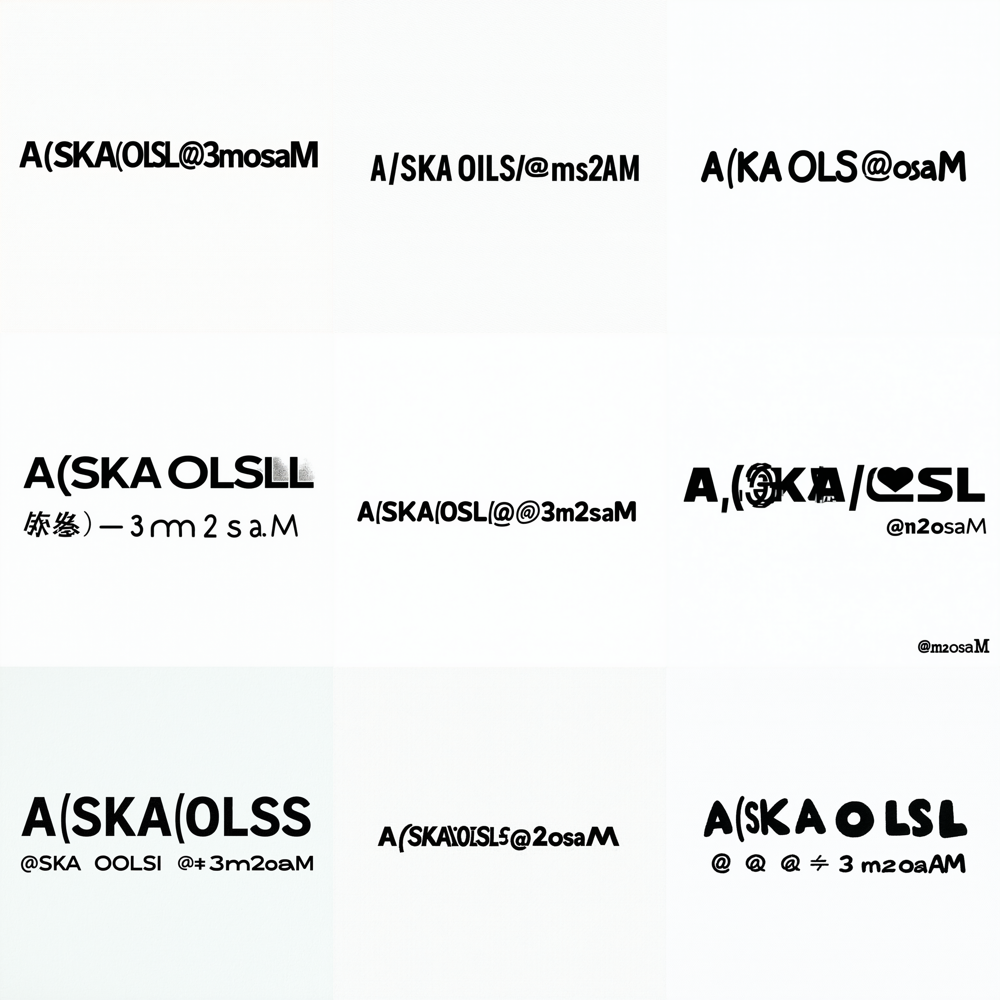

In [13]:
from PIL import Image
import math

# Create a new image with 3x3 grid
def display_3x3(images):
    width = images[0].width * 3
    height = images[0].height * 3
    grid_image = Image.new('RGB', (width, height))

    # Paste all 9 images into the grid
    for idx, img in enumerate(images):
        x = (idx % 3) * images[0].width
        y = (idx // 3) * images[0].height
        grid_image.paste(img, (x, y))
    return grid_image
grid_image = display_3x3(images)
grid_image

In [15]:
# https://huggingface.co/collections/stabilityai/stable-diffusion-35-671785cca799084f71fa2838
pipe_med = StableDiffusion3Pipeline.from_pretrained("stabilityai/stable-diffusion-3.5-medium", torch_dtype=torch.bfloat16)
pipe_med = pipe_med.to("cuda:2")



Loading pipeline components...:  33%|███▎      | 3/9 [00:19<00:45,  7.62s/it]

In [ ]:
images_med = pipe_med(
    'The crisp, black text "A(%SKA)OLSL@#<3m2osaM" on a white background. There is nothing else in the image: no logo, no picture, no other text. Just a white background with black characters on one line that are "A(%SKA)OLSL@#<3m2osaM"',
    num_inference_steps=28,
    guidance_scale=3.5,
    num_images_per_prompt=num_images
).images
grid_image_med = display_3x3(images_med)
grid_image_med
